<a href="https://colab.research.google.com/github/nikoshaa/2141720007-pcvk-2023/blob/main/Week-7/Week7.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

**Filter Spasial Low Pass Filter, High Pass Filter, Point Detection, Line Detection, Edge Detection**

Wildan Hafidz Mauludin

2141720007

**Tugas Praktikum**

In [ ]:
import numpy as np
import matplotlib.pyplot as plt
import cv2 as cv
import math
from google.colab.patches import cv2_imshow
from PIL import Image as im

from google.colab import drive

drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


*Konvolusi tanpa Library*

**Membuat fungsi konvlusi**

Fungsi konvolusi:

1. Citra masukan,
2. Kernel berupa matriks untuk memfilter citra,
3. Nilai stride/besarnya pergeseran untuk setiap konvolusi,
4. Nilai pad yang akan ditambahkan pada citra



In [ ]:
def convolution2d(image, kernel, stride, padding):

  image = np.pad(image, padding, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape
  padded_height, padded_width = image.shape

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1

  new_image = np.zeros((output_height, output_width)).astype(np.float32)

  for y in range(0, output_height):
    for x in range(0, output_width):
      new_image[y][x] = np.sum(image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)

  return new_image
img = cv.imread('/content/drive/MyDrive/female.tiff')
img_gray = cv.cvtColor(img, cv.COLOR_BGR2GRAY)

**Menerapkan setiap filter yang telah ditentukan**

*Average Filter*

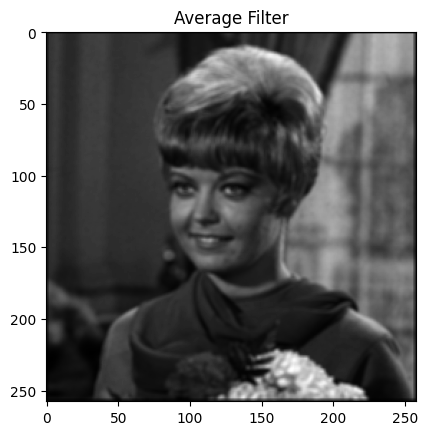

In [ ]:
#average filter
kernel_average_filter = np.array([[1, 1, 1],
                                  [1, 1, 1],
                                  [1, 1, 1]])/9

plt.title('Average Filter')
result = convolution2d(img_gray, kernel_average_filter, 1, 2)

plt.imshow(result, cmap='gray')

plt.show()

*Low Pass Filter*

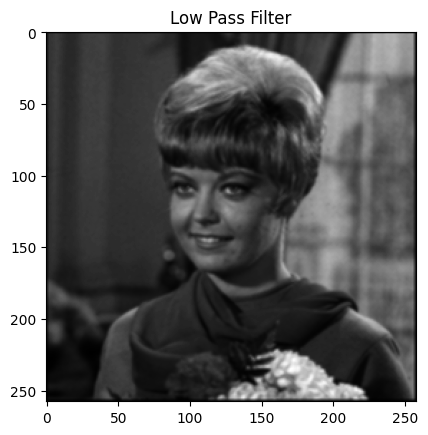

In [ ]:
#low pass filter
kernel_low_pass_filter = np.array([[1, 1, 1],
                                   [1, 4, 1],
                                   [1, 1, 1]])/12

plt.title('Low Pass Filter')
result = convolution2d(img_gray, kernel_low_pass_filter, 1, 2)

plt.imshow(result, cmap='gray')

plt.show()

*High Pass Filter*

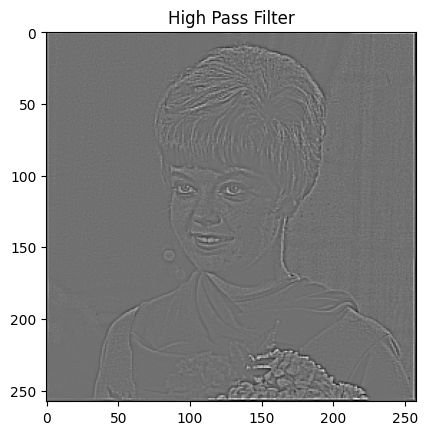

In [ ]:
#high pass filter
kernel_high_pass_filter = np.array([[-1, -1, -1],
                                    [-1,  8, -1],
                                    [-1, -1, -1]])
plt.title('High Pass Filter')
result = convolution2d(img_gray, kernel_high_pass_filter, 1, 2)

plt.imshow(result, cmap='gray')

plt.show()

*Operasi Sharpen*

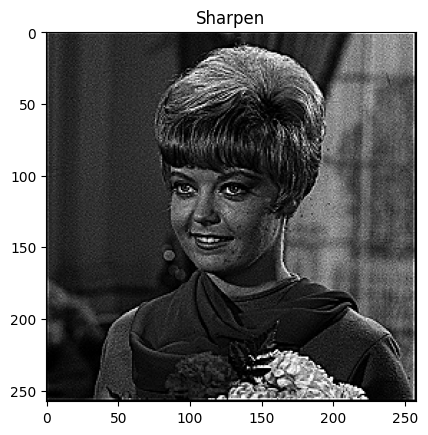

In [ ]:
kernel_sharpen = np.array([[0,-1,0],
                           [-1,5,-1],
                           [0,-1,0]])

img_conv = convolution2d(img_gray, kernel_sharpen, 1, 2)
img_conv_norm = np.clip(img_conv, 0, 255).astype(np.uint8)
img_conv_norm = (img_conv_norm - np.min(img_conv_norm)) / (np.max(img_conv_norm) - np.min(img_conv_norm))
plt.title('Sharpen')
plt.imshow(img_conv_norm,cmap='gray')

*Operasi Embos*

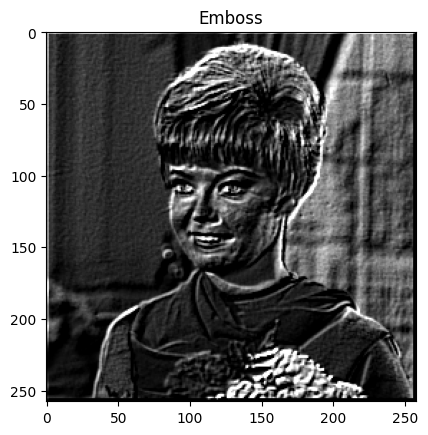

In [ ]:
kernel_emboss = np.array([[-2,-1,0],
                          [-1,1,1],
                          [0,1,2]])

img_conv = convolution2d(img_gray, kernel_emboss, 1, 2)
img_conv_norm = np.clip(img_conv, 0, 255).astype(np.uint8)
img_conv_norm = (img_conv_norm - np.min(img_conv_norm)) / (np.max(img_conv_norm) - np.min(img_conv_norm))
plt.title('Emboss')
plt.imshow(img_conv_norm,cmap='gray')

*Operasi Left Sobel Edge Detection*

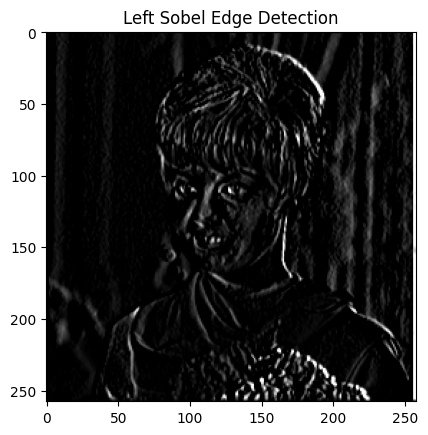

In [ ]:
kernel_sobel = np.array([[1,0,-1],
                         [2,0,-2],
                         [1,0,-1]])

img_conv = convolution2d(img_gray, kernel_sobel, 1, 2)
img_conv_norm = np.clip(img_conv, 0, 255).astype(np.uint8)
img_conv_norm = (img_conv_norm - np.min(img_conv_norm)) / (np.max(img_conv_norm) - np.min(img_conv_norm))
plt.title('Left Sobel Edge Detection')
plt.imshow(img_conv_norm,cmap='gray')

*Canny Edge Detection*

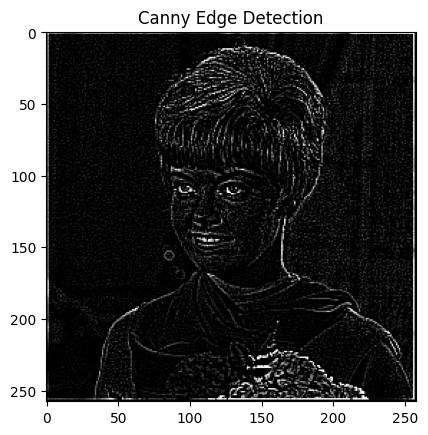

In [ ]:
kernel_canny = np.array([[-1,-1,-1],
                         [-1,8,-1],
                         [-1,-1,-1]])

img_conv = convolution2d(img_gray, kernel_canny, 1, 2)
img_conv_norm = np.clip(img_conv, 0, 255).astype(np.uint8)
img_conv_norm = (img_conv_norm - np.min(img_conv_norm)) / (np.max(img_conv_norm) - np.min(img_conv_norm))
plt.title('Canny Edge Detection')
plt.imshow(img_conv_norm,cmap='gray')

*Operasi Prewitt Edge Detection*

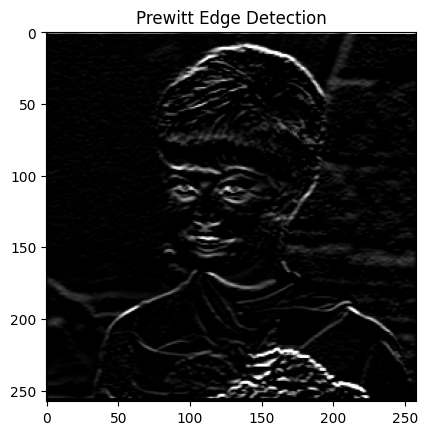

In [ ]:
kernel_prewitt = np.array([[-1,-1,-1],
                           [0,0,0],
                           [1,1,1]])

img_conv = convolution2d(img_gray, kernel_prewitt, 1, 2)
img_conv_norm = np.clip(img_conv, 0, 255).astype(np.uint8)
img_conv_norm = (img_conv_norm - np.min(img_conv_norm)) / (np.max(img_conv_norm) - np.min(img_conv_norm))
plt.title('Prewitt Edge Detection')
plt.imshow(img_conv_norm,cmap='gray')

*Operasi 5x5 Gaussian Blur*

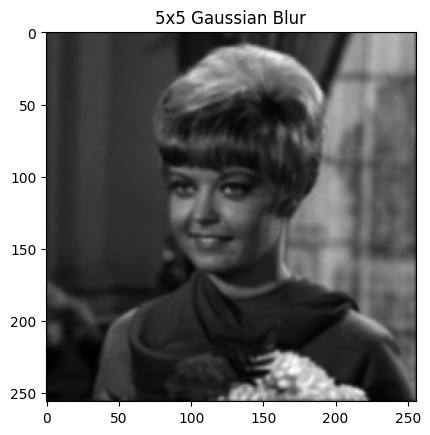

In [ ]:
# 5x5 gaussian blur
gaussian_5 = np.array([[1, 4, 6, 4, 1],
                       [4, 16, 24, 16, 4],
                       [6, 24, 36, 24, 6],
                       [4, 16, 24, 16, 4],
                       [1, 4, 6, 4, 1]])/256

plt.title('5x5 Gaussian Blur')
result = convolution2d(img_gray, gaussian_5, 1, 2)

plt.imshow(result, cmap='gray')

plt.show()

*Operasi 21x21 Gaussian Blur*

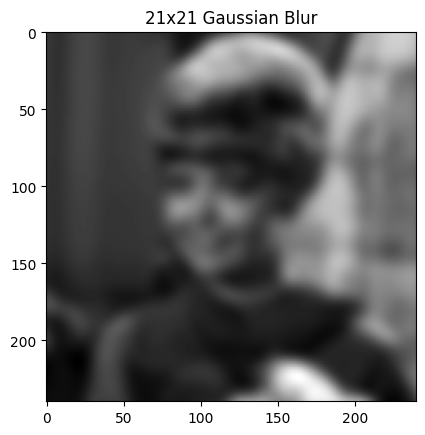

In [ ]:
kernel_size = 21
sigma = math.sqrt(kernel_size)
gaussian_kernel = cv.getGaussianKernel(kernel_size, sigma)
gauss_kernel = gaussian_kernel @ gaussian_kernel.transpose()

plt.title('21x21 Gaussian Blur')
result = convolution2d(img_gray, gauss_kernel, 1, 2)

plt.imshow(result, cmap='gray')

plt.show()

**Tugas**

Diketahui dataset KTP dengan kondisi citra yang berbeda. Lakukan perbaikan melalui implementasi teknik filterisasi dan detection setiap citra. Terapkan juga histogram equalization dan operasi aritmatika sebagai Teknik pendukung perbaikan citra KTP.

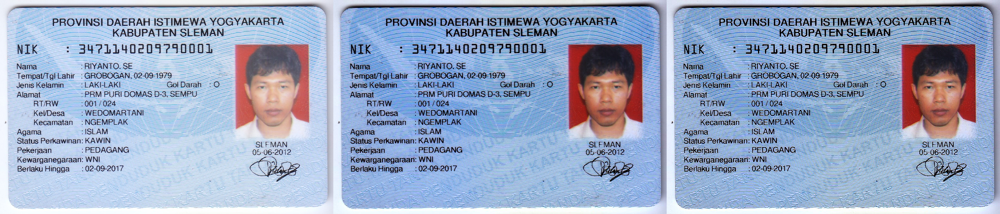

In [ ]:
def gamma_correction(image, gamma):
  inv_gamma = 1 / gamma
  gamma_image = np.zeros(image.shape, image.dtype)

  # Akses per pixel
  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      for c in range(image.shape[2]):
        gamma_image[y, x, c] = np.clip((image[y, x, c] / 255) ** inv_gamma * 255, 0, 255)

  return gamma_image

def hitung_pixel(image):
  red = {}
  green = {}
  blue = {}

  # Akses per pixel
  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      b = int(image[y, x, 0])
      g = int(image[y, x, 1])
      r = int(image[y, x, 2])

      if r in red:
        red[r] += 1
      else:
        red[r] = 1

      if g in green:
        green[g] += 1
      else:
        green[g] = 1

      if b in blue:
        blue[b] += 1
      else:
        blue[b] = 1

  return red, green, blue

def histogram_equalization(image):

  # Intensitas Pixel
  intensitas_merah, intensitas_hijau, intensitas_biru = hitung_pixel(image)

  red_channel = hitung_sk(image[...,2], intensitas_merah)
  green_channel = hitung_sk(image[...,1], intensitas_hijau)
  blue_channel = hitung_sk(image[...,0], intensitas_biru)

  merged_image = cv.merge([blue_channel, green_channel, red_channel])

  return merged_image

def hitung_sk(image, list_intensitas):
  list_intensitas = dict(sorted(list_intensitas.items()))

  # l, rj dan nrj
  l = 256
  rj = list(list_intensitas.keys())
  nrj = list(list_intensitas.values())

  # K0
  k0 = []
  for i in range(len(rj)):
    if i == 0:
      k0.append(nrj[i])
    else:
      k0.append(nrj[i] + k0[i - 1])

  # Sk = round((L-1)/MAX(k0) * k0)
  sk = []
  list_pixel_baru = {}
  for i in range(len(rj)):
    k0s = (l - 1) / k0[-1] * k0[i]
    sk.append(round(k0s))

    list_pixel_baru[rj[i]] = sk[i]

  # Konversi nilai pixel
  for y in range(image.shape[0]):
    for x in range(image.shape[1]):
      image[y, x] = list_pixel_baru[image[y, x]]

  return image

kernel_sharpen = np.array([[0, -1, 0],
                          [-1, 5, -1],
                          [0, -1, 0]], dtype=np.float32)

unsharp_masking_5_x_5 = np.array([[1, 4, 6, 4, 1],
                                [4, 16, 24, 16, 4],
                                [6, 24, -476, 24, 6],
                                [4, 16, 24, 16, 4],
                                [1, 4, 6, 4, 1]], dtype=np.float32)

unsharp_masking_5_x_5 = unsharp_masking_5_x_5 * -1 / 256

def convolution2d(image, kernel):
    return cv.filter2D(image, -1, kernel)

# ...

ktp = cv.imread('/content/drive/MyDrive/KTP_More/ktp.png')
ktp_copy = np.copy(ktp)
ktp_result = gamma_correction(ktp_copy, 0.5)
ktp_filtered = convolution2d(ktp_result, unsharp_masking_5_x_5)

final_frame = cv.hconcat((ktp, ktp_result, ktp_filtered))
cv2_imshow(final_frame)

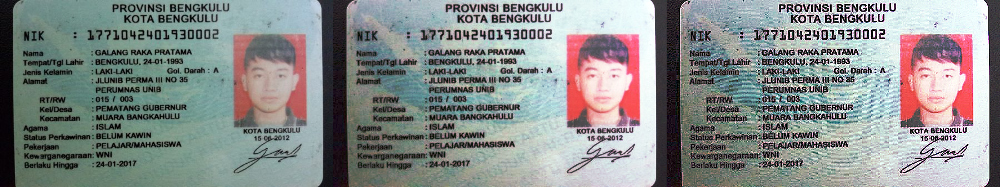

In [ ]:
ktp1 = cv.imread('/content/drive/MyDrive/KTP_More/ktp1.png')
ktp1_copy = np.copy(ktp1)
ktp1_result = histogram_equalization(ktp1_copy)
ktp1_result = gamma_correction(ktp1_result, 1.4)
ktp1_filtered = convolution2d(ktp1_result, kernel_sharpen)

final_frame = cv.hconcat((ktp1, ktp1_result, ktp1_filtered))
cv2_imshow(final_frame)

In [ ]:
ktp2 = cv.imread('/content/drive/MyDrive/KTP_More/ktp2.png')
ktp2_copy = np.copy(ktp2)
ktp2_result = gamma_correction(ktp2_copy, 0.6)
ktp2_filtered = convolution2d(ktp2_result, unsharp_masking_5_x_5)

final_frame = cv.hconcat((ktp2, ktp2_result, ktp2_filtered))
cv2_imshow(final_frame)

In [ ]:
ktp3 = cv.imread('/content/drive/MyDrive/KTP_More/ktp3.png')
ktp3_copy = np.copy(ktp3)
ktp3_result = gamma_correction(ktp3_copy, 0.5)
ktp3_filtered = convolution2d(ktp3_result, kernel_sharpen)

final_frame = cv.hconcat((ktp3, ktp3_result, ktp3_filtered))
cv2_imshow(final_frame)

In [ ]:
# Penggunaan kernel unsharp masking 5 x 5

unsharp_masking_5_x_5 = np.array([[1, 4, 6, 4, 1],
                                [4, 16, 24, 16, 4],
                                [6, 24, -476, 24, 6],
                                [4, 16, 24, 16, 4],
                                [1, 4, 6, 4, 1]], dtype=np.float32)

unsharp_masking_5_x_5 = unsharp_masking_5_x_5 * -1 / 256

ktp5 = cv.imread('/content/drive/MyDrive/KTP_More/ktp5.png')
ktp5_copy = np.copy(ktp5)
ktp5_result = gamma_correction(ktp5_copy, 0.6)
ktp5_filtered = convolution2d(ktp5_result, unsharp_masking_5_x_5)

final_frame = cv.hconcat((ktp5, ktp5_result, ktp5_filtered))
cv2_imshow(final_frame)

In [ ]:
ktp6 = cv.imread('/content/drive/MyDrive/KTP_More/ktp6.png')
ktp6_copy = np.copy(ktp6)
ktp6_result = gamma_correction(ktp6_copy, 0.3)
ktp6_filtered = convolution2d(ktp6_result, unsharp_masking_5_x_5)

final_frame = cv.hconcat((ktp6, ktp6_result, ktp6_filtered))
cv2_imshow(final_frame)


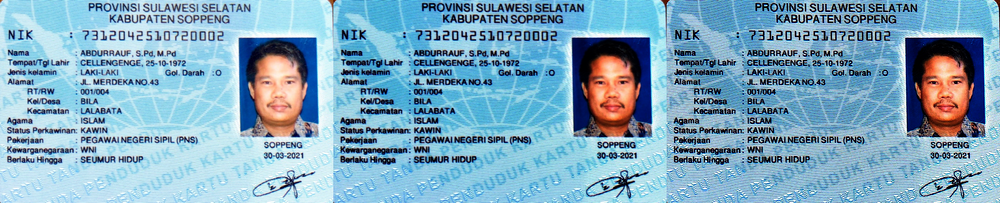

In [ ]:
ktp7 = cv.imread('/content/drive/MyDrive/KTP_More/KTP7.jpeg')
ktp7_copy = np.copy(ktp7)
ktp7_result = gamma_correction(ktp7_copy, 0.48)
ktp7_filtered = convolution2d(ktp7_result, kernel_sharpen)

final_frame = cv.hconcat((ktp7, ktp7_result, ktp7_filtered))
cv2_imshow(final_frame)

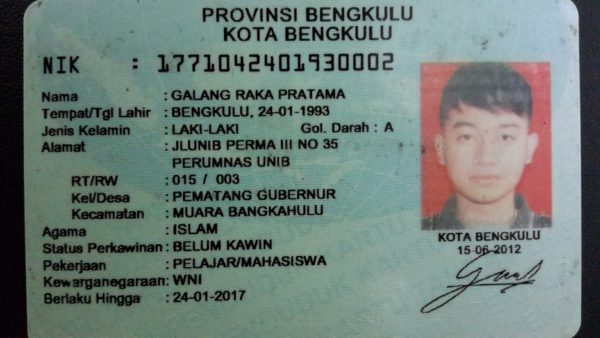

In [ ]:
ktp_ori = cv.imread('/content/drive/MyDrive/KTP_More/ktp1.png')
cv2_imshow(ktp_ori)

*Operasi Aritmatika Gamma Correction*

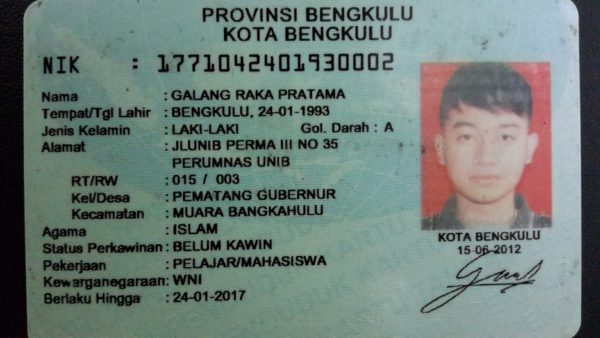

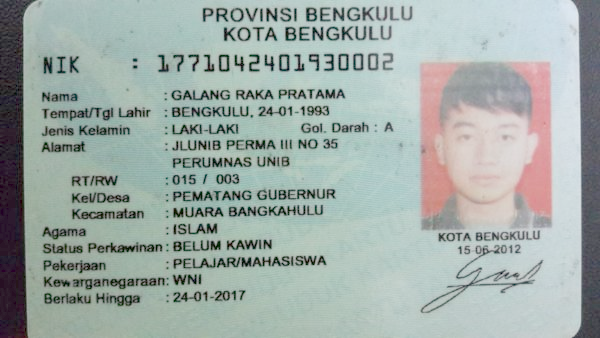

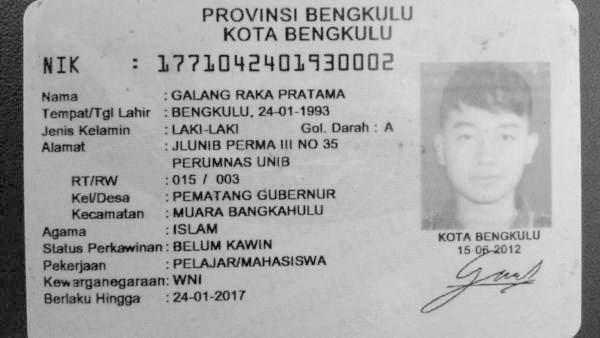

In [ ]:
# Gamma Correction & Convert ke Grayscale
gamma_image = np.zeros(ktp_ori.shape, ktp_ori.dtype)
for y in range(ktp_ori.shape[0]):
  for x in range(ktp_ori.shape[1]):
    for c in range(ktp_ori.shape[2]):
      gamma_image[y,x,c] = np.clip((255 * ((ktp_ori[y,x,c]/255)**(1/2))), 0, 255)

ktp_gray = cv.cvtColor(gamma_image, cv.COLOR_BGR2GRAY)
cv2_imshow(ktp_ori)
cv2_imshow(gamma_image)
cv2_imshow(ktp_gray)

*Histogram Equalization*

Berdasarkan hasil equalization di bawah, penggunaan Histogram Equalization tidak diperlukan karena hasil histogram equalization membuat citra menjadi tidak lebih baik.


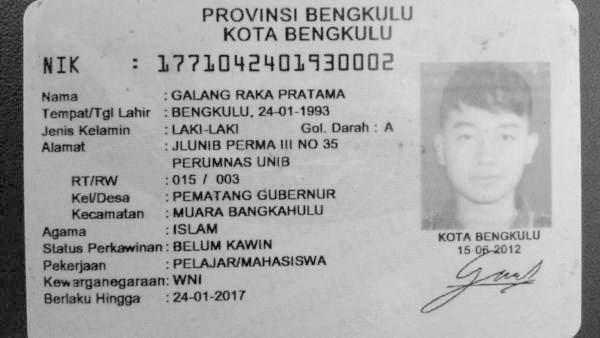

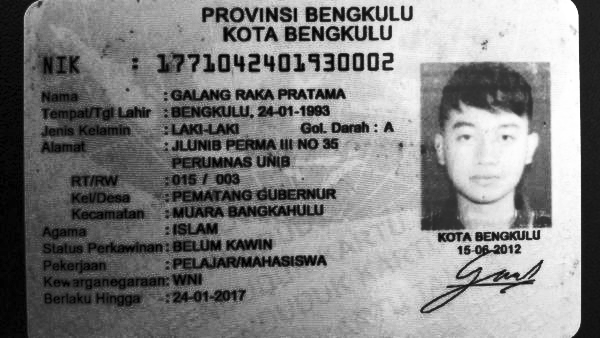

In [ ]:
ktp_equalized = cv.equalizeHist(ktp_gray)
cv2_imshow(ktp_gray)
cv2_imshow(ktp_equalized)

*Fungsi Konvolusi*

In [ ]:
def convolution2d(image, kernel, stride, padding):

  image = np.pad(image, padding, mode='constant', constant_values=0)

  kernel_height, kernel_width = kernel.shape
  padded_height, padded_width = image.shape

  output_height = (padded_height - kernel_height) // stride + 1
  output_width = (padded_width - kernel_width) // stride + 1

  new_img = np.zeros((output_height, output_width)).astype(np.float32)

  for y in range(0, output_height):
    for x in range(0, output_width):
      new_img[y][x] = np.sum(image[y * stride:y * stride + kernel_height, x * stride:x * stride + kernel_width] * kernel).astype(np.float32)

  return new_img

*Filterisasi*



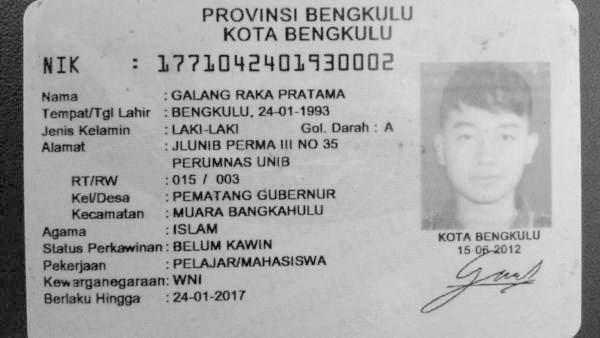

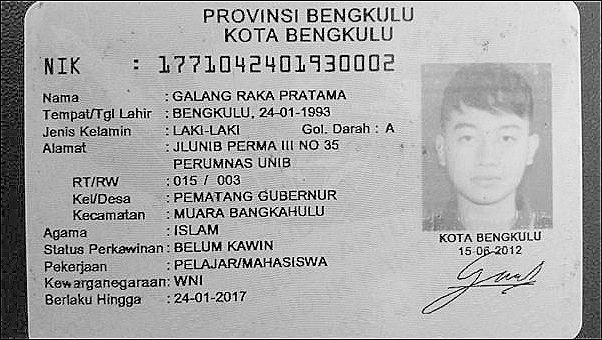

In [ ]:
# Filterisasi (Sharpening Filter (Meningkatkan detail tulisan sehingga terlihat jelas perbedaan karakter huruf dengan background))
def sharpening_filter(gray_img):
    kernel_sharpening_filter = np.array([[0, -1, 0],
                                        [-1, 5, -1],
                                        [0, -1, 0]])
    sharp_filter_image = convolution2d(gray_img, kernel_sharpening_filter, 1, 2)
    return sharp_filter_image

sharp_filter_image = sharpening_filter(ktp_gray)
cv2_imshow(ktp_gray)
cv2_imshow(sharp_filter_image)

*Low Pass Filter*

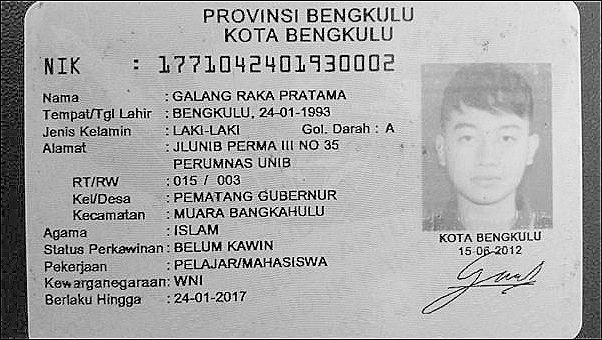

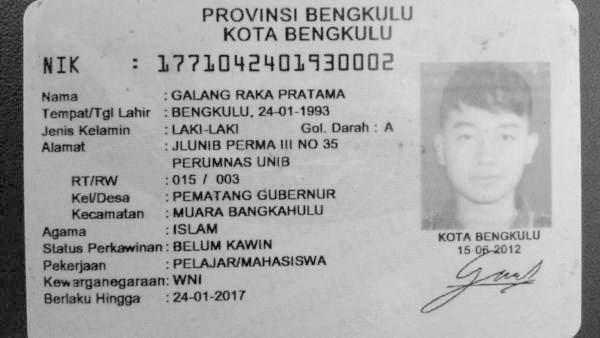

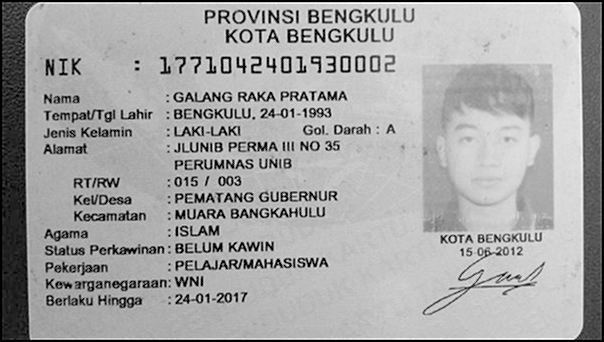

In [ ]:
# Low Pass Filter (Mengurangi Noise dan Menghaluskan hasil Sharpening)
def low_pass_filter(gray_img):
    kernel_low_pass_filter = np.array([[1, 1, 1],
                                      [1, 4, 1],
                                      [1, 1, 1]])/12
    low_pass_image = convolution2d(gray_img, kernel_low_pass_filter, 1, 2)
    return low_pass_image

low_filter_image = low_pass_filter(sharp_filter_image)
# Atas Sharpening
cv2_imshow(sharp_filter_image)
# Tengah Original
cv2_imshow(ktp_gray)
# Bawah Hasil Filterisasi
cv2_imshow(low_filter_image)

*Edge Detection*

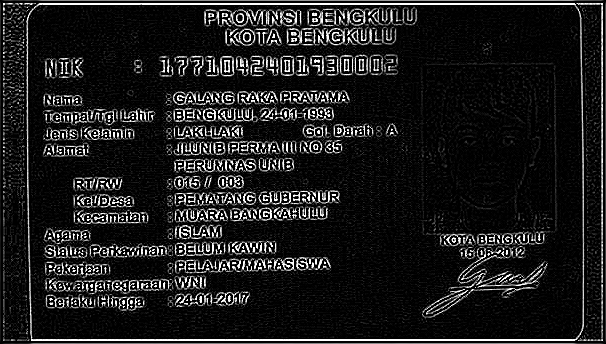

In [ ]:
# Canny Edge Detection
canny_edge_detection = np.array([[-1, -1, -1],
                                [-1, 8, -1],
                                [-1, -1, -1]])
canny_image = convolution2d(low_filter_image, canny_edge_detection, 1, 2)
cv2_imshow(canny_image)